# All Imports

In [75]:
import pandas as pd
%matplotlib inline
import seaborn as sns
import numpy as np
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

# File reads

In [2]:
file_KG=pd.read_csv("Food_Supply_Quantity_kg_Data.csv")

In [18]:
file_KG.columns
file_KG['Undernourished'] = pd.to_numeric(file_KG['Undernourished'],errors='coerce')

In [3]:
file_kcal=pd.read_csv("Food_Supply_kcal_Data.csv")


In [17]:
file_kcal.columns
file_kcal['Undernourished'] = pd.to_numeric(file_KG['Undernourished'],errors='coerce')


In [26]:
file_KG.isnull().sum()

Country                         0
Alcoholic Beverages             0
Animal fats                     0
Animal Products                 0
Aquatic Products, Other         0
Cereals - Excluding Beer        0
Eggs                            0
Fish, Seafood                   0
Fruits - Excluding Wine         0
Meat                            0
Milk - Excluding Butter         0
Miscellaneous                   0
Offals                          0
Oilcrops                        0
Pulses                          0
Spices                          0
Starchy Roots                   0
Stimulants                      0
Sugar & Sweeteners              0
Sugar Crops                     0
Treenuts                        0
Vegetable Oils                  0
Vegetables                      0
Vegetal Products                0
Obesity                         0
Undernourished                  0
Confirmed                       0
Deaths                          0
Recovered                       0
Active        

In [20]:
file_KG.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170 entries, 0 to 169
Data columns (total 32 columns):
Country                         170 non-null object
Alcoholic Beverages             170 non-null float64
Animal fats                     170 non-null float64
Animal Products                 170 non-null float64
Aquatic Products, Other         170 non-null float64
Cereals - Excluding Beer        170 non-null float64
Eggs                            170 non-null float64
Fish, Seafood                   170 non-null float64
Fruits - Excluding Wine         170 non-null float64
Meat                            170 non-null float64
Milk - Excluding Butter         170 non-null float64
Miscellaneous                   170 non-null float64
Offals                          170 non-null float64
Oilcrops                        170 non-null float64
Pulses                          170 non-null float64
Spices                          170 non-null float64
Starchy Roots                   170 non-null flo

In [13]:
file_kcal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170 entries, 0 to 169
Data columns (total 32 columns):
Country                         170 non-null object
Alcoholic Beverages             170 non-null float64
Animal Products                 170 non-null float64
Animal fats                     170 non-null float64
Aquatic Products, Other         170 non-null float64
Cereals - Excluding Beer        170 non-null float64
Eggs                            170 non-null float64
Fish, Seafood                   170 non-null float64
Fruits - Excluding Wine         170 non-null float64
Meat                            170 non-null float64
Milk - Excluding Butter         170 non-null float64
Miscellaneous                   170 non-null float64
Offals                          170 non-null float64
Oilcrops                        170 non-null float64
Pulses                          170 non-null float64
Spices                          170 non-null float64
Starchy Roots                   170 non-null flo

In [25]:
file_kcal.isnull().sum()

Country                         0
Alcoholic Beverages             0
Animal Products                 0
Animal fats                     0
Aquatic Products, Other         0
Cereals - Excluding Beer        0
Eggs                            0
Fish, Seafood                   0
Fruits - Excluding Wine         0
Meat                            0
Milk - Excluding Butter         0
Miscellaneous                   0
Offals                          0
Oilcrops                        0
Pulses                          0
Spices                          0
Starchy Roots                   0
Stimulants                      0
Sugar Crops                     0
Sugar & Sweeteners              0
Treenuts                        0
Vegetal Products                0
Vegetable Oils                  0
Vegetables                      0
Obesity                         0
Undernourished                  0
Confirmed                       0
Deaths                          0
Recovered                       0
Active        

# Filling Missing Value

In [24]:
file_KG["Obesity"]=file_KG["Obesity"].fillna(file_KG["Obesity"].mean())
file_KG["Undernourished"]=file_KG["Undernourished"].fillna(file_KG["Undernourished"].mean())
file_KG["Confirmed"]=file_KG["Confirmed"].fillna(file_KG["Confirmed"].mean())
file_KG["Deaths"]=file_KG["Deaths"].fillna(file_KG["Deaths"].mean())
file_KG["Recovered"]=file_KG["Recovered"].fillna(file_KG["Recovered"].mean())
file_KG["Active"]=file_KG["Active"].fillna(file_KG["Active"].mean())
file_kcal["Obesity"]=file_kcal["Obesity"].fillna(file_kcal["Obesity"].mean())
file_kcal["Undernourished"]=file_kcal["Undernourished"].fillna(file_kcal["Undernourished"].mean())
file_kcal["Confirmed"]=file_kcal["Confirmed"].fillna(file_kcal["Confirmed"].mean())
file_kcal["Deaths"]=file_kcal["Deaths"].fillna(file_kcal["Deaths"].mean())
file_kcal["Recovered"]=file_kcal["Recovered"].fillna(file_kcal["Recovered"].mean())
file_kcal["Active"]=file_kcal["Active"].fillna(file_kcal["Active"].mean())

# Food supply in kg scatter matrix

C:\Users\jony\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead



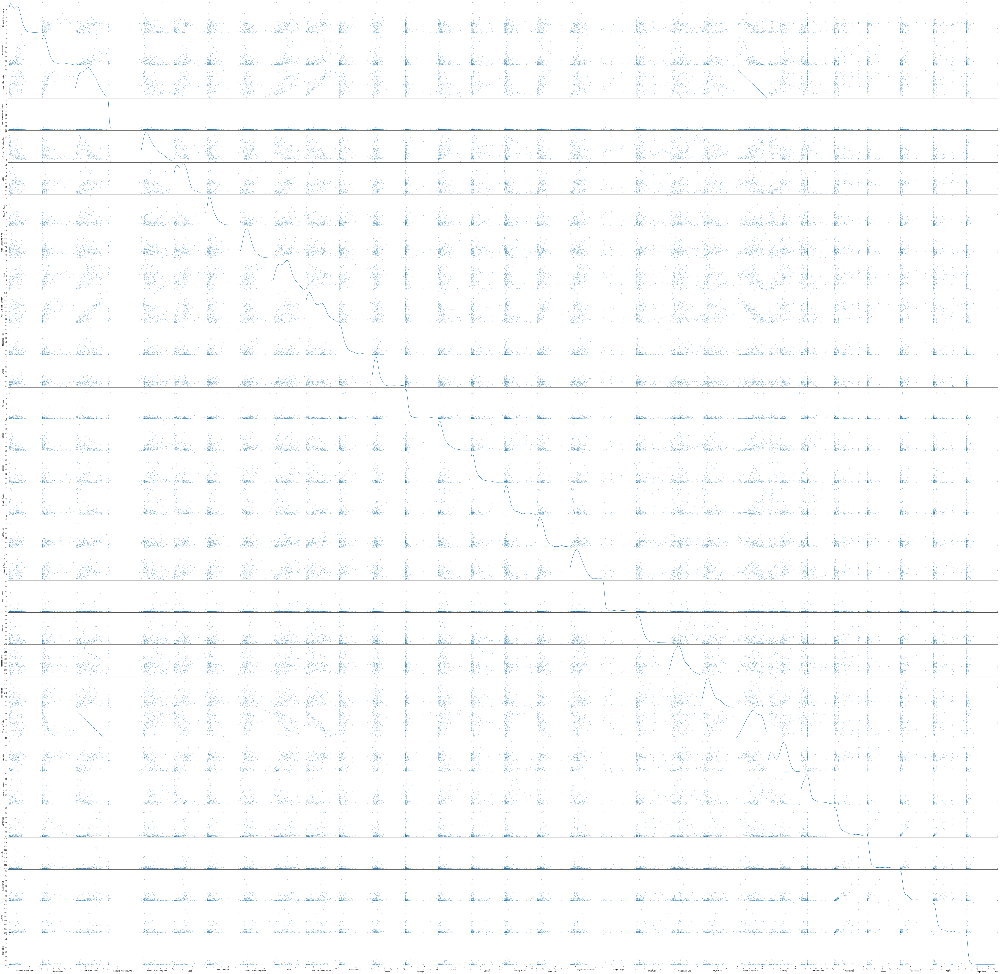

In [27]:
fig_scatter_matrix_kg=pd.scatter_matrix(file_KG.loc[:,"Country":"Population"],diagonal="kde",figsize=(100,100))

In [15]:
file_KG = file_KG.replace(regex=r'^<2.5', value=2.5)
file_kcal = file_kcal.replace(regex=r'^<', value=2.5)

# Food supply in kcal Scatter matrix

C:\Users\jony\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead



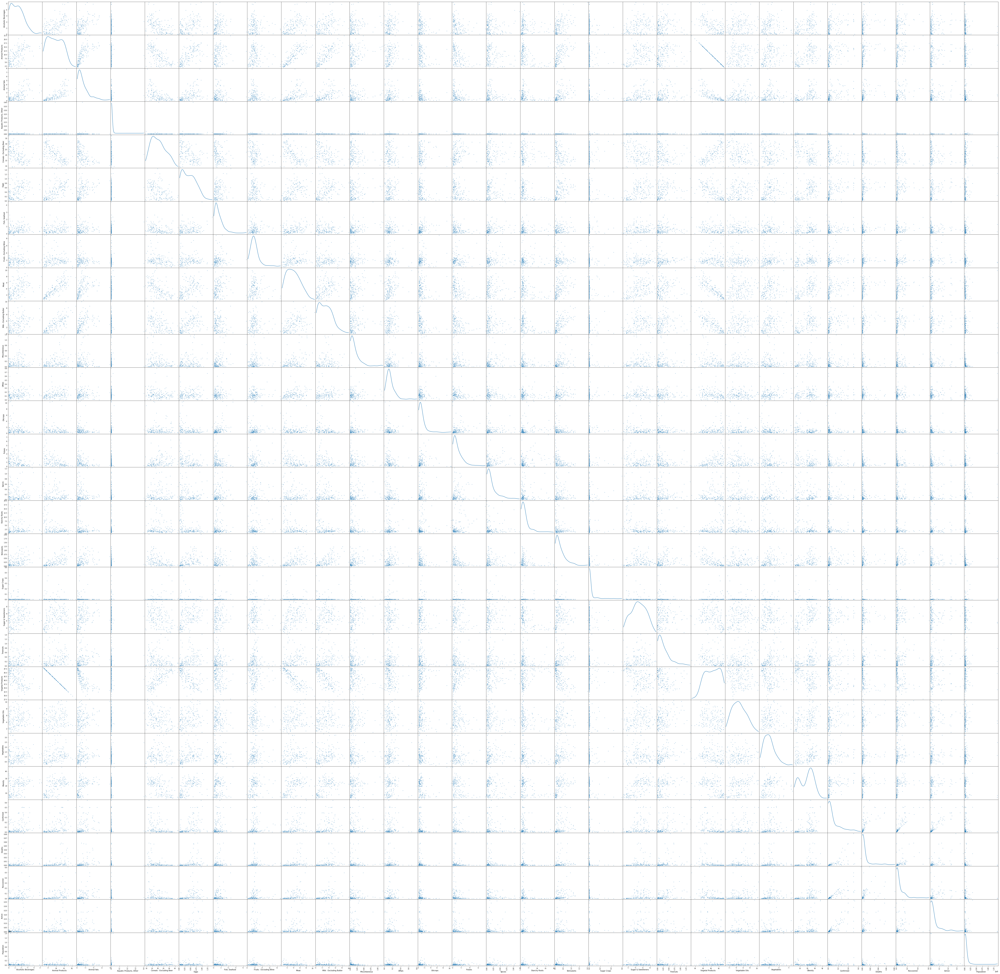

In [8]:
fig_scatter_matrix_kcal=pd.scatter_matrix(file_kcal.loc[:,"Country":"Population"],diagonal="kde",figsize=(100,100))

# Country vs Death of food supply kg(%)

In [28]:
fig_country_death_kg = go.Figure()
fig_country_death_kg.add_trace(go.Scatter(
    x=file_KG["Country"],
    y=file_KG["Deaths"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_country_death_kg.update_layout(
    title="Country vs Death rate in %",
    xaxis_title="Country",
    yaxis_title="Death")

fig_country_death_kg.show()

# Country vs Death of food supply kcal(%)

In [29]:
fig_country_death_kcal = go.Figure()
fig_country_death_kcal.add_trace(go.Scatter(
    x=file_kcal["Country"],
    y=file_kcal["Deaths"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_country_death_kcal.update_layout(
    title="Country vs Death rate in %",
    xaxis_title="Country",
    yaxis_title="Death")

fig_country_death_kcal.show()

# Country vs Confirmed cases for food supply kg(%)

In [30]:
fig_country_confirmed_kg = go.Figure()
fig_country_confirmed_kg.add_trace(go.Scatter(
    x=file_KG["Country"],
    y=file_KG["Confirmed"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_country_confirmed_kg.update_layout(
    title="Country vs Confirmed case in %",
    xaxis_title="Country",
    yaxis_title="Confirmed")

fig_country_confirmed_kg.show()

# Country vs Confirmed cases for food supply kcal(%)

In [31]:
fig_country_confirmed_kcal = go.Figure()
fig_country_confirmed_kcal.add_trace(go.Scatter(
    x=file_kcal["Country"],
    y=file_kcal["Confirmed"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_country_confirmed_kcal.update_layout(
    title="Country vs Confirmed case in %",
    xaxis_title="Country",
    yaxis_title="Confirmed")

fig_country_confirmed_kcal.show()

# Country vs Recovery for food supply kg(%)

In [32]:
fig_country_recovery_kg = go.Figure()
fig_country_recovery_kg.add_trace(go.Scatter(
    x=file_KG["Country"],
    y=file_KG["Recovered"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_country_recovery_kg.update_layout(
    title="Country vs Recovered case in %",
    xaxis_title="Country",
    yaxis_title="Recovered")

fig_country_recovery_kg.show()

# Country vs Recovery for food supply kcal(%)

In [33]:
fig_country_recovery_kcal = go.Figure()
fig_country_recovery_kcal.add_trace(go.Scatter(
    x=file_kcal["Country"],
    y=file_kcal["Recovered"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_country_recovery_kcal.update_layout(
    title="Country vs Recovered case in %",
    xaxis_title="Country",
    yaxis_title="Recovered")

fig_country_recovery_kcal.show()

# Obesity vs Alcoholic Bevarage vs Death in kg (%)

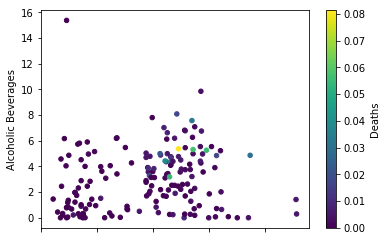

In [34]:
file_KG.plot.scatter(x="Obesity",y="Alcoholic Beverages",c="Deaths",cmap='viridis')
# plt.savefig("Obesity vs Alcoholic beverages and death (Kg).png")

# Obesity vs Alcoholic Bevarage vs Death in kcal (%)

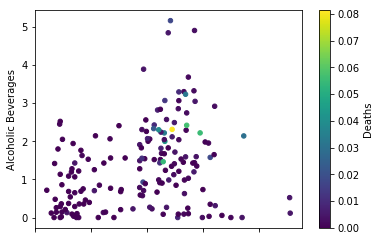

In [35]:
file_kcal.plot.scatter(x="Obesity",y="Alcoholic Beverages",c="Deaths",cmap='viridis')
plt.savefig("Obesity vs Alcoholic beverages and death (kcal).png")

# Alcoholic Bevarage vs Death in kg (%)

In [36]:
fig_alcohole_death_kg = go.Figure()
fig_alcohole_death_kg.add_trace(go.Scatter(
    x=file_KG["Alcoholic Beverages"],
    y=file_KG["Deaths"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_alcohole_death_kg.update_layout(
    title="Alcoholic Bevarages vs Death case in %",
    xaxis_title="Alcoholic Bevarages",
    yaxis_title="Deaths")

fig_alcohole_death_kg.show()

# Alcoholic Bevarage vs Confirmed cases in kg (%)

In [37]:
fig_alcohole_confirmed_kg = go.Figure()
fig_alcohole_confirmed_kg.add_trace(go.Scatter(
    x=file_KG["Alcoholic Beverages"],
    y=file_KG["Confirmed"],
    mode="markers",
    marker=go.scatter.Marker(
        size=np.random.rand(100)*30,
        color=np.random.rand(100),
        opacity=0.6,
        colorscale="Viridis"
    )
))
fig_alcohole_confirmed_kg.update_layout(
    title="Alcoholic Bevarages vs Confirmed case in %",
    xaxis_title="Alcoholic Bevarages",
    yaxis_title="Confirmed")

fig_alcohole_confirmed_kg.show()

In [27]:
file_KG.describe()

,Alcoholic Beverages,Animal fats,Animal Products,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,...,Treenuts,Vegetable Oils,Vegetables,Vegetal Products,Obesity,Confirmed,Deaths,Recovered,Active,Population
count,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,...,170.000000,170.000000,170.000000,170.000000,167.000000,161.000000,161.000000,161.000000,161.000000,1.700000e+02
mean,3.022971,0.221064,12.181871,0.013994,11.800347,0.470570,1.387195,5.621405,3.375934,6.519776,...,0.117474,0.851554,6.085912,37.814834,18.707784,0.091657,0.004647,0.049167,0.037907,4.408395e+07
std,2.382243,0.278304,5.852635,0.129382,5.824870,0.331209,1.257382,3.152849,1.762911,5.020379,...,0.146143,0.445335,3.560148,5.852943,9.633557,0.136390,0.011673,0.088856,0.071751,1.556265e+08
min,0.000000,0.001000,1.739100,0.000000,3.401400,0.023900,0.034200,0.659600,0.356000,0.096300,...,0.000000,0.091500,0.857000,23.113200,2.100000,0.000094,0.000000,0.000000,0.000000,5.300000e+04
25%,0.895625,0.040225,7.236850,0.000000,7.226850,0.187575,0.557100,3.541950,1.891475,2.172250,...,0.020750,0.507700,3.616500,33.552775,8.500000,0.006811,0.000161,0.002856,0.001583,2.822750e+06
50%,2.866150,0.116850,12.097550,0.000000,10.142750,0.460150,1.029250,5.021250,3.424750,5.336900,...,0.079950,0.774450,5.028100,37.900700,21.200000,0.026019,0.000562,0.012411,0.008071,1.014600e+07
75%,4.710950,0.253900,16.444125,0.001400,15.148950,0.644150,1.821275,6.827750,4.422450,10.407100,...,0.148650,1.070900,7.801650,42.762775,25.700000,0.122200,0.002937,0.050643,0.026886,3.169250e+07
max,15.370600,1.355900,26.886500,1.679400,29.804500,1.696000,8.795900,19.302800,8.170000,20.837800,...,0.756900,2.202600,19.299500,48.258500,45.600000,0.644032,0.081271,0.609839,0.370184,1.398030e+09


In [43]:
file_KG.isnull().sum()

Country                         0
Alcoholic Beverages             0
Animal fats                     0
Animal Products                 0
Aquatic Products, Other         0
Cereals - Excluding Beer        0
Eggs                            0
Fish, Seafood                   0
Fruits - Excluding Wine         0
Meat                            0
Milk - Excluding Butter         0
Miscellaneous                   0
Offals                          0
Oilcrops                        0
Pulses                          0
Spices                          0
Starchy Roots                   0
Stimulants                      0
Sugar & Sweeteners              0
Sugar Crops                     0
Treenuts                        0
Vegetable Oils                  0
Vegetables                      0
Vegetal Products                0
Obesity                         0
Undernourished                  0
Confirmed                       0
Deaths                          0
Recovered                       0
Active        

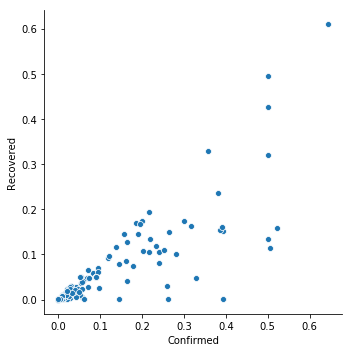

In [38]:
sns.relplot(x="Confirmed",y="Recovered", data=file_KG)

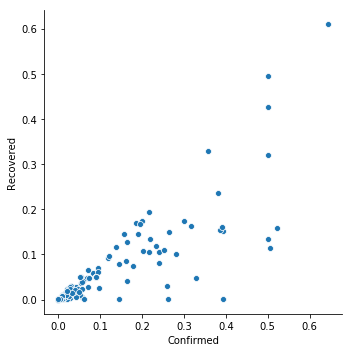

In [39]:
sns.relplot(x="Confirmed",y="Recovered", data=file_kcal)

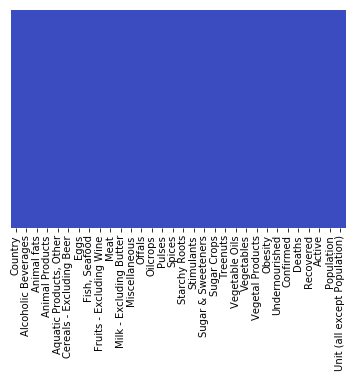

In [41]:
sns.heatmap(file_KG.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

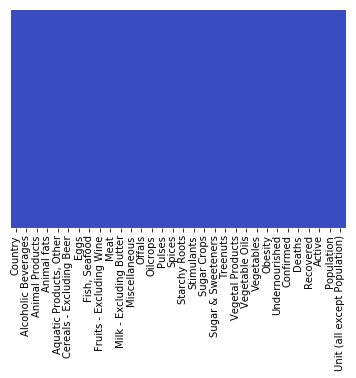

In [42]:
sns.heatmap(file_kcal.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

In [61]:
Xkg=file_KG[["Confirmed","Obesity","Undernourished"]]
ykg=file_KG.loc[:,"Alcoholic Beverages":"Vegetal Products"]
Xkcal=file_KG[["Confirmed","Obesity","Undernourished"]]
ykcal=file_KG.loc[:,"Alcoholic Beverages":"Vegetal Products"]

In [63]:
X_train_kg,X_test_kg,y_train_kg,y_test_kg=train_test_split(Xkg,ykg,test_size=0.2)
X_train_kcal,X_test_kcal,y_train_kcal,y_test_kcal=train_test_split(Xkcal,ykcal,test_size=0.2)

In [65]:
linear_Regerssion_kg=LinearRegression()
linear_Regerssion_kcal=LinearRegression()

In [82]:
linear_Regerssion_kg.fit(X_train_kg,y_train_kg)
linear_Regerssion_kcal.fit(X_train_kcal,y_train_kcal)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [87]:
linear_Regerssion_kg.predict(X_test_kg)

array([[ 2.92131897e+00,  2.39688524e-01,  1.30229530e+01,
         9.51820748e-03,  1.05429294e+01,  5.59040513e-01,
         1.22063153e+00,  6.57161697e+00,  3.94491929e+00,
         6.86580440e+00,  6.35258791e-01,  1.83321835e-01,
         1.12759094e+00,  4.38165580e-01,  1.08753623e-01,
         4.15818683e+00,  1.78368605e-01,  3.28534694e+00,
         2.34709079e-02,  9.61059298e-02,  8.96056911e-01,
         5.99647651e+00,  3.69744663e+01],
       [ 2.98018568e+00,  2.64948358e-01,  1.40249946e+01,
         1.09596893e-02,  9.84424198e+00,  6.20097615e-01,
         1.34601170e+00,  6.62871162e+00,  4.16701358e+00,
         7.44067623e+00,  6.73763994e-01,  1.75293594e-01,
         1.18259198e+00,  3.43972816e-01,  1.20656781e-01,
         3.08420121e+00,  1.90864928e-01,  3.42673597e+00,
         1.69472187e-02,  1.12514694e-01,  8.88523570e-01,
         6.48386086e+00,  3.59722046e+01],
       [ 2.83198655e+00,  1.93729159e-01,  1.13747051e+01,
         1.40139181e-02,  1.2

In [88]:
linear_Regerssion_kcal.predict(X_test_kcal)

array([[ 3.58514276e+00,  2.70826504e-01,  1.23895731e+01,
         1.87827232e-03,  1.00836642e+01,  3.36927028e-01,
         4.80780488e-01,  6.28961433e+00,  3.96450173e+00,
         7.13880027e+00,  2.88057291e-01,  1.95686302e-01,
         8.00471306e-01,  5.71237674e-01, -4.35736213e-03,
         6.76451066e+00,  1.72912553e-01,  3.33454604e+00,
         6.06775435e-02,  6.32065573e-02,  9.78121960e-01,
         4.62469563e+00,  3.76085741e+01],
       [ 2.67045978e+00,  1.73852481e-01,  1.12907532e+01,
         6.17559446e-03,  1.21812541e+01,  4.77290235e-01,
         1.57830475e+00,  6.04696773e+00,  3.34842094e+00,
         5.52008841e+00,  5.12026059e-01,  1.86744418e-01,
         1.23462774e+00,  5.44145858e-01,  1.21500460e-01,
         5.05378613e+00,  1.77110637e-01,  2.92839089e+00,
         7.68375710e-02,  1.11296139e-01,  8.51190856e-01,
         6.20264176e+00,  3.87061200e+01],
       [ 2.73110606e+00,  9.35022320e-02,  8.14512990e+00,
         2.92834513e-03,  1.5

In [85]:
ridge_kg=Ridge().fit(X_train_kg,y_train_kg)
ridge_kcal=Ridge().fit(X_train_kcal,y_train_kcal)
lasso_kg=Lasso().fit(X_train_kg,y_train_kg)
lasso_kcal=Lasso().fit(X_train_kcal,y_train_kcal)

In [97]:
ridge_kg.predict(X_test_kg)
ridge_kcal.predict(X_test_kcal)
lasso_kg.predict(X_test_kg)
lasso_kcal.predict(X_test_kcal)

array([[ 3.68172252e+00,  2.38843307e-01,  1.43382050e+01,
         4.25588235e-03,  8.88237623e+00,  4.25723028e-01,
         1.10660755e+00,  5.91484102e+00,  4.08805085e+00,
         8.18115827e+00,  4.50609525e-01,  1.85051471e-01,
         5.77252988e-01,  4.63161064e-01,  8.83647059e-02,
         6.03689363e+00,  2.06589706e-01,  3.34253980e+00,
         6.54485294e-02,  1.16263235e-01,  8.55352206e-01,
         4.81822254e+00,  3.56591589e+01],
       [ 3.06475823e+00,  2.31132730e-01,  1.22979183e+01,
         4.25588235e-03,  1.15799673e+01,  4.72305047e-01,
         1.57634363e+00,  5.79236379e+00,  3.37964542e+00,
         6.42636623e+00,  4.52754028e-01,  1.85051471e-01,
         1.03757699e+00,  5.36511952e-01,  8.83647059e-02,
         4.70969550e+00,  2.06589706e-01,  2.88166661e+00,
         6.54485294e-02,  1.16263235e-01,  8.55352206e-01,
         6.25667533e+00,  3.76985296e+01],
       [ 2.89650937e+00,  2.20413148e-01,  8.43199419e+00,
         4.25588235e-03,  1.5

In [101]:
kg_score_Linear=linear_Regerssion_kg.score(X_test_kg,y_test_kg)
kcal_score_Linear=linear_Regerssion_kcal.score(X_test_kcal,y_test_kcal)
kg_score_ridge=ridge_kg.score(X_test_kg,y_test_kg)
kcal_score_ridge=ridge_kcal.score(X_test_kcal,y_test_kcal)
kg_score_lasso=lasso_kg.score(X_test_kg,y_test_kg)
kcal_score_lasso=lasso_kcal.score(X_test_kcal,y_test_kcal)

In [102]:
print("Score for Linear regrassion of food supply kg data is:",kg_score_Linear)
print("Score for Linear regrassion of food supply kcal data is:",kcal_score_Linear)
print("Score for Ridge regrassion of food supply kg data is:",kg_score_ridge)
print("Score for Ridge regrassion of food supply kcal data is:",kcal_score_ridge)
print("Score for Lasso regrassion of food supply kg data is:",kg_score_lasso)
print("Score for Lasso regrassion of food supply kcal data is:",kcal_score_lasso)

Score for Linear regrassion of food supply kg data is: 0.04802725991085354
Score for Linear regrassion of food supply kcal data is: 0.04592868999329499
Score for Ridge regrassion of food supply kg data is: 0.04839507622902284
Score for Ridge regrassion of food supply kcal data is: 0.07475617190429998
Score for Lasso regrassion of food supply kg data is: 0.023740905670519712
Score for Lasso regrassion of food supply kcal data is: 0.1098096277190236
